In [4]:
import cv2

# Reading Images

In [5]:
img = cv2.imread('/content/pic.jpg')

In [6]:
from google.colab.patches import cv2_imshow

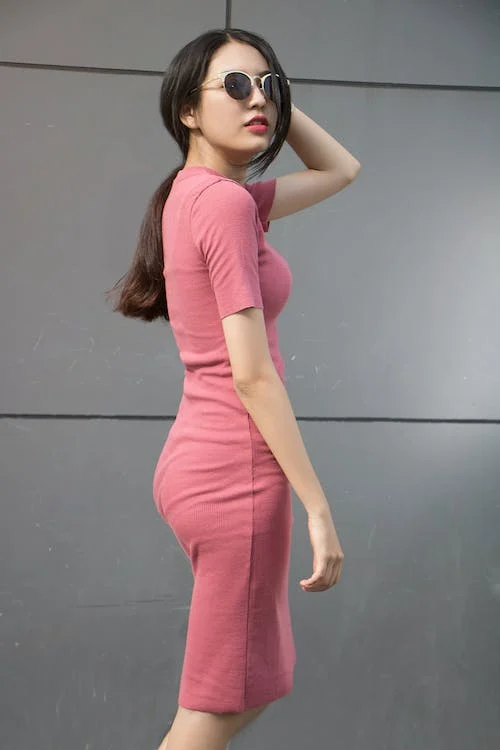

-1

In [7]:
cv2_imshow(img)
cv2.waitKey(0)

# Reading video

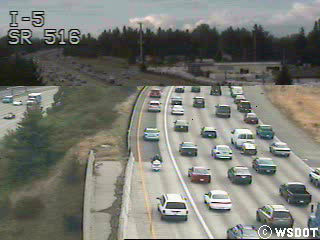

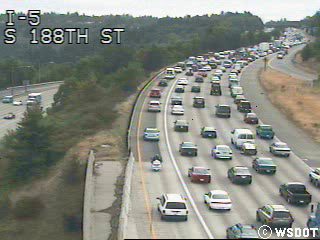

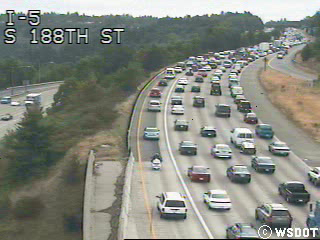

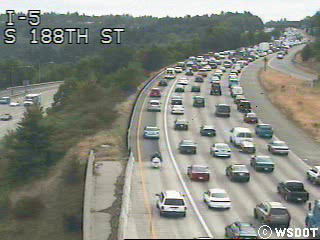

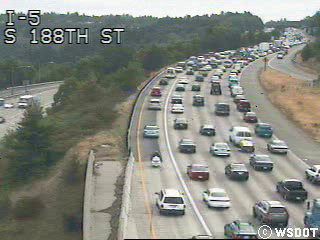

...

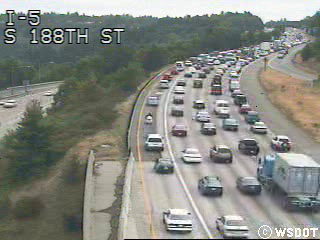

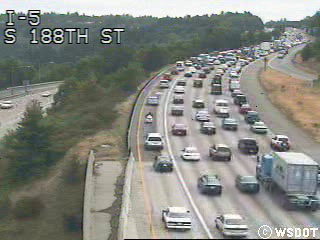

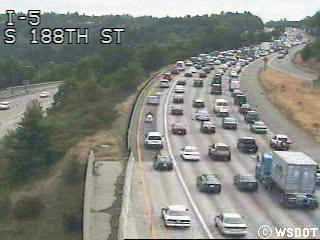

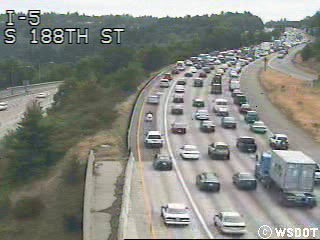

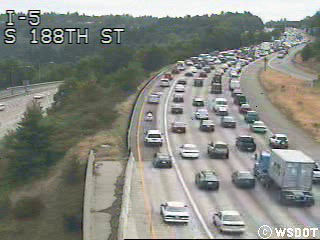

In [50]:
cap = cv2.VideoCapture('/content/cctv052x2004080518x01668.avi')
while True:
  success , frame = cap.read()
  if not success:
    break
  cv2_imshow(frame)
  if cv2.waitKey(1) & 0xFF == ord('q'):
    break

# Using WebCam

In [ ]:
# Open the webcam
video = cv2.VideoCapture(0)
video.set(3,640)   ### To set width of output window
video.set(4,480)   ### To set height of output window
video.set(10,100)  ### To set brighness of output window

# Loop to continuously read and display frames from the webcam
while True:
    ret, frame = video.read()
    cv2_imshow(frame)

    # Stop the loop if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the webcam and close the windows
video.release()
cv2.destroyAllWindows()


# Converting RGB image to grayscale

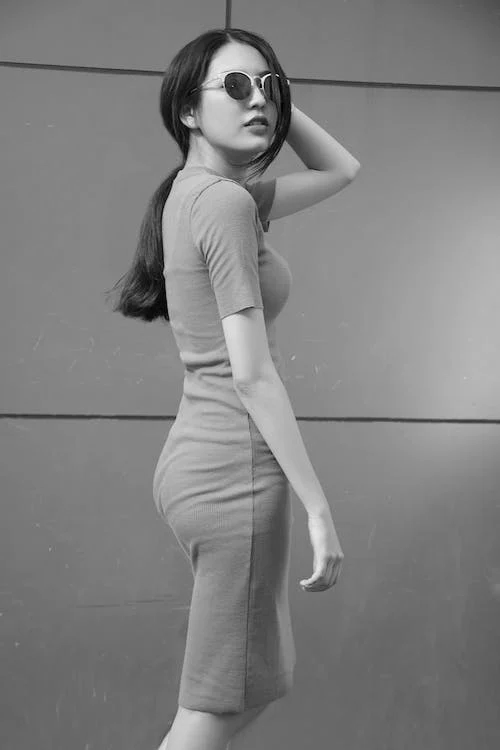

-1

In [8]:
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
cv2_imshow(img_gray)
cv2.waitKey(0)

# Blurring entire  image

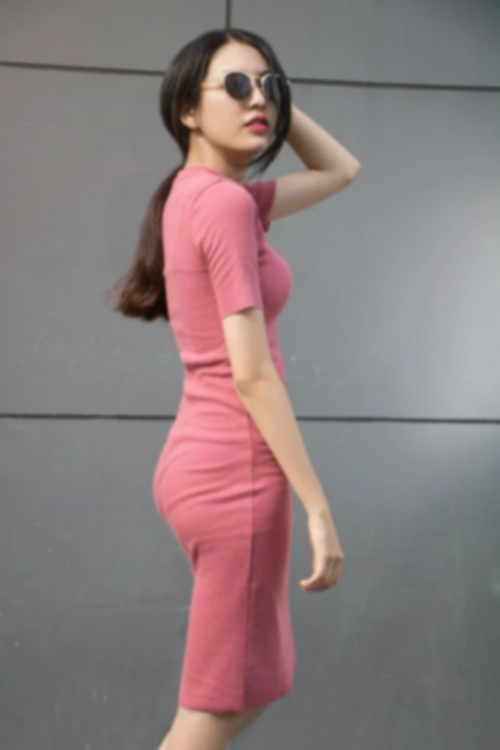

-1

In [9]:
img_blur = cv2.GaussianBlur(img,(7,7),0)    ### (7,7) is kernal size for blur
cv2_imshow(img_blur)
cv2.waitKey(0)

# Finding edge of image

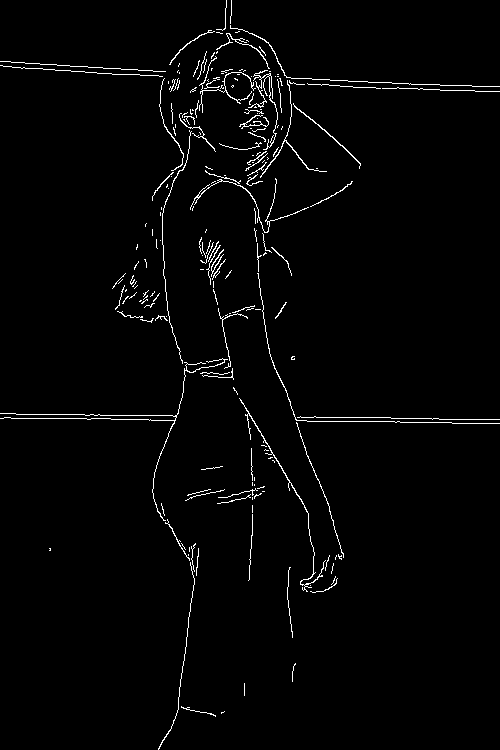

-1

In [10]:
img_edge = cv2.Canny(img,150,200)
cv2_imshow(img_edge)
cv2.waitKey(0)

# Resizing image

In [11]:
print(img.shape)

(750, 500, 3)


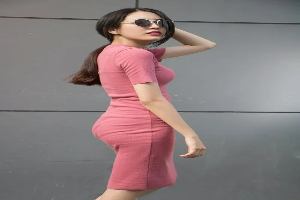

-1

In [12]:
img_resize = cv2.resize(img,(300,200))
cv2_imshow(img_resize)
cv2.waitKey(0)

# Cropping image

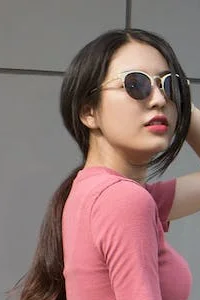

In [13]:
img_crop = img[0:300,100:300]        ## Image is matrices of units from 0-255 so we can slice it to get it some part
cv2_imshow(img_crop)

In [14]:
import numpy as np

## Shapes and Text on images

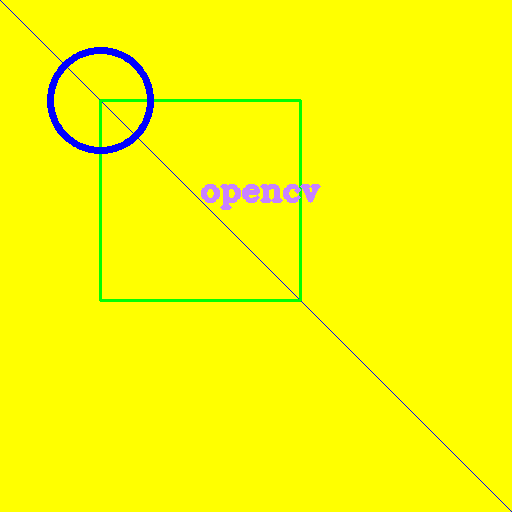

In [15]:
sheet = np.zeros((512,512,3),dtype=np.uint8)   ## its BGR sheet
sheet[:] = 0,255,255   ## Giving color to sheet
cv2.line(sheet,(0,0),(sheet.shape[1],sheet.shape[0]),(255,0,0),1)  ## Making Line on sheet
cv2.rectangle(sheet,(100,100),(300,300),(0,255,0),2,2)             ## Making Rectangle on sheet
cv2.circle(sheet,(100,100),50,(255,0,0),5)                         ## Making circle on shet
cv2.putText(sheet,'opencv',(200,200),cv2.FONT_HERSHEY_COMPLEX,1,(255,130,200),3)  ## Writing text on sheet
cv2_imshow(sheet)

# Warp Transfomation

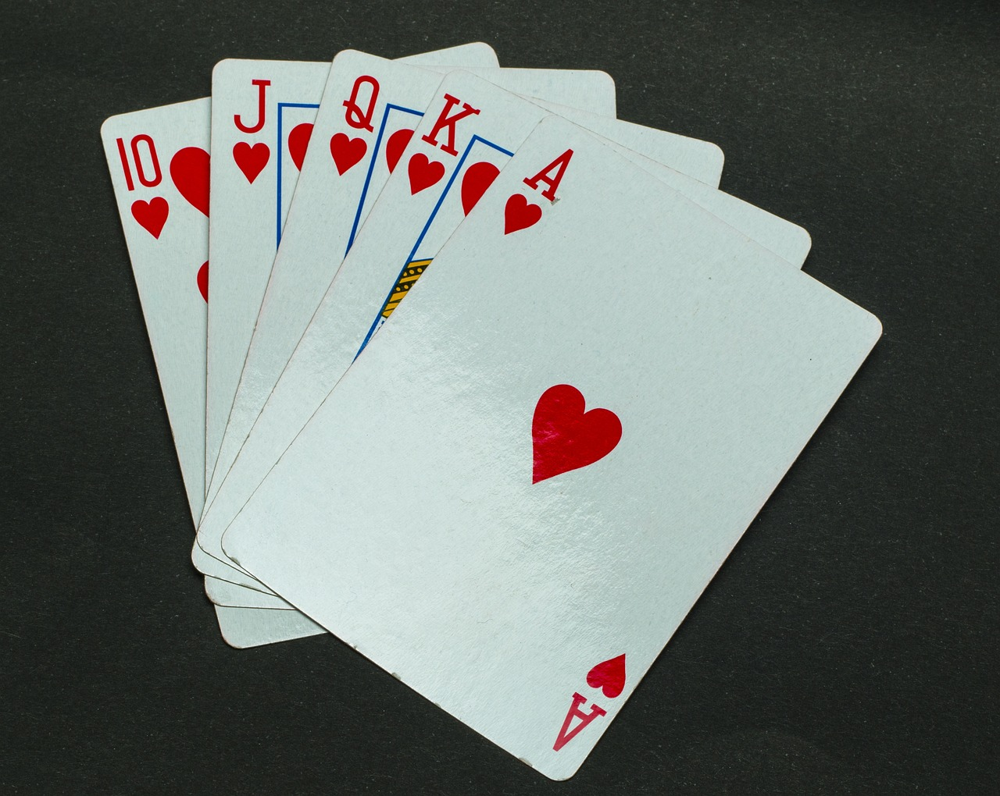

In [16]:
card_img = cv2.imread('/content/poker.jpg')
cv2_imshow(card_img)

In [17]:
card_img.shape

(1020, 1280, 3)

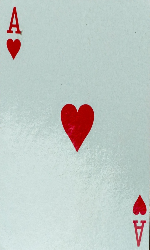

In [18]:
width,height = 150 , 250        ## Dimension of required image
pts1 = np.float32([[701,154],[1126,418],[286,704],[740,994]])     ## To get cordinate of corner open image in paint and click on corner
pts2 = np.float32([[0,0],[width,0],[0,height],[width,height]])
matrix = cv2.getPerspectiveTransform(pts1,pts2)
warp_image = cv2.warpPerspective(card_img,matrix,(width,height))
cv2_imshow(warp_image)

## Joining two or more image

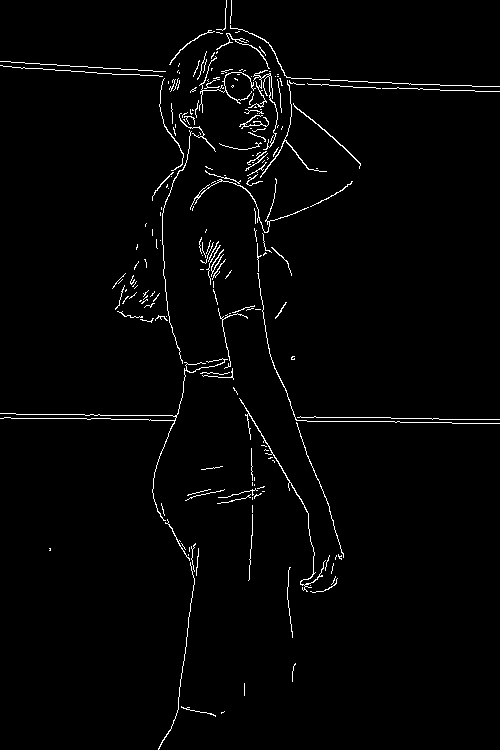

In [19]:
edge_img = cv2.imread('/content/edge_img.png')
cv2_imshow(edge_img)

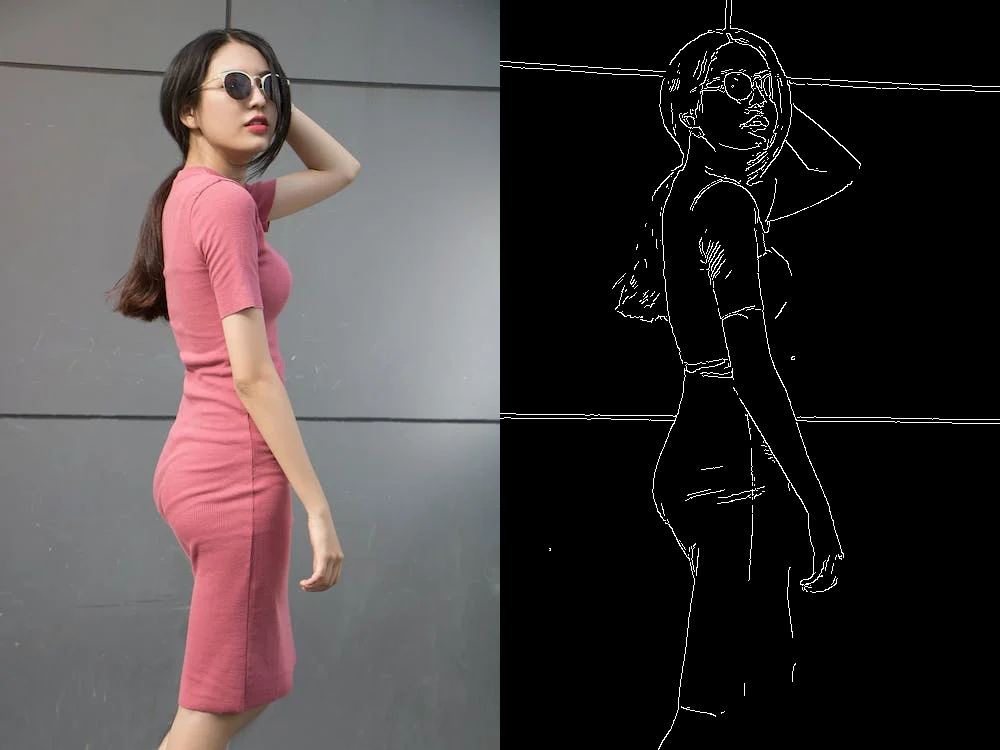

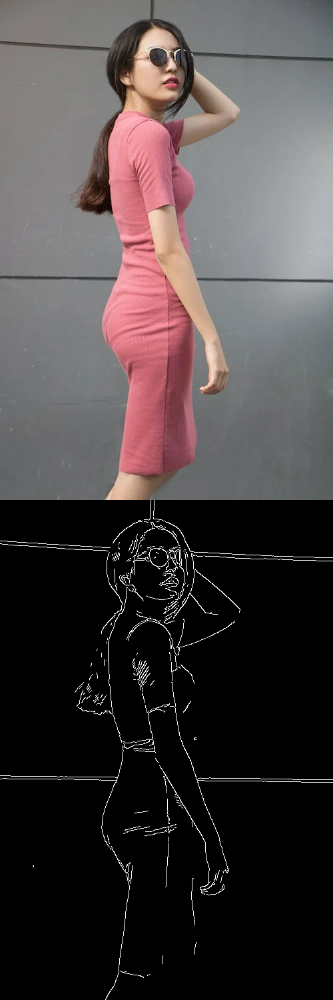

In [20]:
hstack = np.hstack((img,edge_img))       ## its simply stacking of numpy array---->All images should be of same scale (grayscale or RGB)
vstack = np.vstack((img,edge_img))
cv2_imshow(hstack)
cv2_imshow(vstack)

# Detecting Color in images

In [ ]:
# Making an empty function
def empty(a):
  pass
# Making TrackBar
cv2.namedWindow('TrackBars')
cv2.resizeWindow('TrackBars',640,240)
cv2.createTrackbar('Hue Min','TrackBars',0,179,empty)  # empty is an function which will run everytime the value changes
cv2.createTrackbar('Hue Max','TrackBars',179,179,empty)
cv2.createTrackbar('Sat Min','TrackBars',0,255,empty)
cv2.createTrackbar('Sat Max','TrackBars',255,255,empty)
cv2.createTrackbar('Val Min','TrackBars',0,255,empty)
cv2.createTrackbar('Val Max','TrackBars',255,255,empty)

while True:
  imghsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
  h_min = cv2.getTrackbarPos('Hue Min','TrackBars')
  h_max = cv2.getTrackbarPos('Hue Max','TrackBars')
  s_min = cv2.getTrackbarPos('Sat Min','TrackBars')
  s_max = cv2.getTrackbarPos('Sat Max','TrackBars')
  v_min = cv2.getTrackbarPos('Val Min','TrackBars')
  v_max = cv2.getTrackbarPos('Val Max','TrackBars')
  print(h_min , h_max , s_min , s_max , v_min , v_max)   ## when we have all this required parameter we will put that in above window insted of default values
  lower = np.array([h_min,s_min , v_min])
  upper = np.array([h_max,s_max , v_max])
  mask = cv2.inRange(imghsv,lower,upper)
  # It will give required colored part from image
  final_image = cv2.bitwise_and(img , img,mask = mask)
  cv2_imshow(final_image)

# Face Detection

In [21]:
image = cv2.imread('/content/ironman.jpg')
face_cascade_face = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')

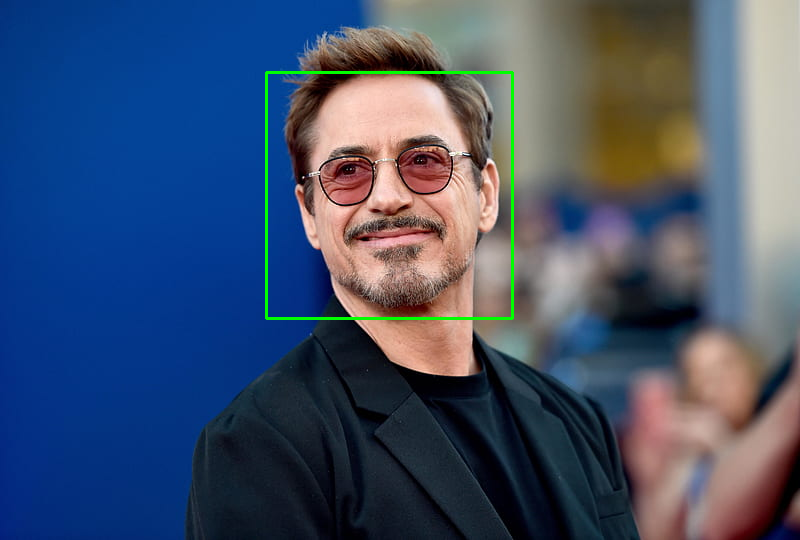

In [22]:
imgGray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
faces = face_cascade_face.detectMultiScale(imgGray , 1.1, 4)

for (x,y,w,h) in faces:
  cv2.rectangle(image,(x,y),(x+w , y+h),(0,255,0),2)

cv2_imshow(image)